#### Setup


In [1]:
import torch
import torchvision
from lib.data_handlers import Load_ImageNet100, Load_PACS, Load_ImageNet100Sketch
from overcomplete.models import DinoV2, ViT, ResNet, ViT_Large, SigLIP
from torch.utils.data import DataLoader, TensorDataset
from overcomplete.sae import TopKSAE, train_sae
from overcomplete.visualization import (overlay_top_heatmaps, evidence_top_images, zoom_top_images, contour_top_image)
import os
import matplotlib.pyplot as plt
from einops import rearrange
from lib.universal_trainer import train_usae
from lib.activation_generator import Load_activation_dataloader
import torch.nn as nn
from torch.optim.lr_scheduler import SequentialLR, LinearLR, CosineAnnealingLR
from lib.eval import evaluate_models
from lib.visualizer import visualize_concepts
from tqdm import tqdm
import timm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.cuda.empty_cache()

c:\Users\sproj_ha\miniconda3\envs\interpretability\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## ImageNet

#### Train SAE

In [2]:
models = {
    "ViT": ViT(device="cuda")
}

activations_dir="/activations/ViT_Solo"

image_loader, image_dataset = Load_ImageNet100(transform=None, batch_size=256, shuffle=True, dataset=True)

activations_dataloader = Load_activation_dataloader(
    models=models,
    image_dataloader=image_loader,
    max_seq_len=196,
    save_dir=activations_dir,
    generate=False,
    rearrange_string='n t d -> (n t) d'
)

Set Parameters

In [3]:
concepts = 768 * 8
epochs = 100
lr=3e-4
sample = next(iter(activations_dataloader))

Execute Flow

In [4]:
SAEs = {}
optimizers = {}
schedulers = {}

for key, model in models.items():

    SAEs[key] = TopKSAE(
        sample[f"activations_{key}"].shape[-1],
        nb_concepts=concepts,
        top_k=16,
        device="cuda",
    )
    optimizers[key] = torch.optim.Adam(SAEs[key].parameters(), lr=lr)

    # Set up a Linear + Cosine Scheduler
    warmup_scheduler = LinearLR(
        optimizers[key], start_factor=1e-6 / 3e-4, end_factor=1.0, total_iters=10
    )
    cosine_scheduler = CosineAnnealingLR(optimizers[key], T_max=epochs, eta_min=1e-6)
    schedulers[key] = SequentialLR(
        optimizers[key],
        schedulers=[warmup_scheduler, cosine_scheduler],
        milestones=[25],
    )

criterion = nn.L1Loss(reduction="mean")  # change to mean reduction

In [5]:
model_path = "./models/ViT_MLP.pt"
state = torch.load(model_path)

for name, sae in SAEs.items():
    print(sae.load_state_dict(state[name]))

<All keys matched successfully>


# MLP

In [6]:
vit_full = timm.create_model('vit_base_patch16_224', pretrained=True)
vit_extractor = models["ViT"]

In [7]:
def remap_predictions(logits, internal_map=None):

    ## Logits should be Logits in the form B x 1000
    assert logits.shape[1] == 1000

    ## Get the internal class to index mapping
    if internal_map is None:
        _, image_dataset = Load_ImageNet100(transform=None, batch_size=256, shuffle=True, dataset=True)
        internal_map = image_dataset.class_to_idx


    ## Get the imagenet idx to class map
    import json
    with open("./datasets/imagenet-class-index-json/imagenet_class_index.json") as f:
        imagenet_idx_map = json.load(f)
    

    ## Extract the WNID labels from output logits
    predicted = torch.argmax(logits, dim=1)
    predicted_classes = [imagenet_idx_map[str(idx)][0] for idx in predicted.tolist()]

    ## Remap them to the internal index
    updated_idxs = [internal_map.get(label, -1) for label in predicted_classes] # Map to -1 if the label does not exist

    return torch.tensor(updated_idxs)


In [8]:
def train_mlp(image_loader, mlp, optimizer, loss_fn, vit_full, sae, internal_map, alpha = 1, epochs=1):
    mlp.to(device)
    vit_full.to(device)
    sae.to(device)
    
    for epoch in range(epochs):
        epoch_loss = 0.0
        pbar = tqdm(image_loader, desc=f"Epoch {epoch+1}/{epochs}", unit="batch")

        for images, labels in pbar:
            images, labels = images.to(device), labels.to(device)

            vit_full.eval()
            with torch.no_grad():
                # Get latent features & ViT predictions
                latent = vit_full.forward_features(images)
                predicted = vit_full.forward_head(latent)

                # Remap predictions to dataset indices
                predicted = remap_predictions(predicted, internal_map=internal_map)
                predicted = predicted.to(device)  # ensure predictions on device

                #print(predicted.shape)

                latent = latent[:, 1:]  # remove CLS token
                
                ## Filter for invalid Predictions
                valid_mask = predicted != -1
                predicted = predicted[valid_mask]
                latent = latent[valid_mask, :, :]

                # SAE encode
                latent = rearrange(latent, 'n t d -> (n t) d')
                _, z = sae.encode(latent)
                z = z.to(device)
                z = rearrange(z, '(n t) d -> n t d', t=196)
                z = z.sum(dim=1, keepdim=True)
                z = z.flatten(start_dim=1)
                #print("Latent Output Shape: ", z.shape)

            mlp.train()
            optimizer.zero_grad()

            y_hat = mlp(z)
            
            l1_norm = sum(param.abs().sum() for name, param in mlp.named_parameters() if "weight" in name)
            loss = loss_fn(y_hat, predicted) + alpha*l1_norm

            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()
            pbar.set_postfix({"loss": f"{loss.item():.4f}"})

        print(f"Epoch {epoch+1} finished. Average loss: {epoch_loss / len(image_loader):.4f}")


def test_mlp(image_loader, mlp, loss_fn, vit_full, sae, internal_map):
    mlp.to(device)
    vit_full.to(device)
    sae.to(device)
    mlp.eval()
    vit_full.eval()
    sae.eval()
    
    total_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        pbar = tqdm(image_loader, desc="Testing", unit="batch")
        for images, labels in pbar:
            images, labels = images.to(device), labels.to(device)

            # Extract ViT features + predictions
            latent = vit_full.forward_features(images)
            predicted = vit_full.forward_head(latent)
            predicted = remap_predictions(predicted, internal_map=internal_map)
            predicted = predicted.to(device)

            latent = latent[:, 1:]  # remove CLS token
            
            # Filter invalid preds
            valid_mask = predicted != -1
            predicted = predicted[valid_mask]
            latent = latent[valid_mask, :, :]

            if predicted.numel() == 0:  # skip batch if all invalid
                continue

            # SAE encode
            latent = rearrange(latent, 'n t d -> (n t) d')
            _, z = sae.encode(latent)
            z = z.to(device)
            z = rearrange(z, '(n t) d -> n t d', t=196)
            z = z.sum(dim=1, keepdim=True)
            z = z.flatten(start_dim=1)

            # MLP forward
            y_hat = mlp(z)

            # Loss
            loss = loss_fn(y_hat, predicted)
            total_loss += loss.item()

            # Accuracy
            preds = torch.argmax(y_hat, dim=1)
            correct += (preds == predicted).sum().item()
            total += predicted.size(0)

            pbar.set_postfix({"loss": f"{loss.item():.4f}"})

    avg_loss = total_loss / len(image_loader)
    accuracy = 100.0 * correct / total if total > 0 else 0.0
    print(f"Test finished. Avg loss: {avg_loss:.4f}, Accuracy: {accuracy:.2f}%")
    return avg_loss, accuracy


## Training

In [11]:
mlp = nn.Linear(concepts, 100) # 100 Classes
optimizer = torch.optim.Adam(params=mlp.parameters(), lr=1e-5) 
loss_fn = nn.CrossEntropyLoss()
sae = SAEs["ViT"]

In [12]:
train_mlp(
    image_loader=image_loader,
    mlp=mlp,
    optimizer=optimizer,
    loss_fn=loss_fn,
    vit_full=vit_full,
    sae=sae,
    internal_map=image_dataset.class_to_idx,
    alpha=0.1,
    epochs=10
)

Epoch 1/10: 100%|██████████| 508/508 [10:12<00:00,  1.21s/batch, loss=202.2942]


Epoch 1 finished. Average loss: 337.9108


Epoch 2/10: 100%|██████████| 508/508 [10:23<00:00,  1.23s/batch, loss=66.9830] 


Epoch 2 finished. Average loss: 124.8621


Epoch 3/10: 100%|██████████| 508/508 [10:24<00:00,  1.23s/batch, loss=33.7518]


Epoch 3 finished. Average loss: 45.0090


Epoch 4/10: 100%|██████████| 508/508 [10:30<00:00,  1.24s/batch, loss=23.0206]


Epoch 4 finished. Average loss: 28.2708


Epoch 5/10: 100%|██████████| 508/508 [10:18<00:00,  1.22s/batch, loss=15.9069]


Epoch 5 finished. Average loss: 19.2640


Epoch 6/10: 100%|██████████| 508/508 [10:13<00:00,  1.21s/batch, loss=10.5423]


Epoch 6 finished. Average loss: 13.2465


Epoch 7/10: 100%|██████████| 508/508 [10:05<00:00,  1.19s/batch, loss=7.7342] 


Epoch 7 finished. Average loss: 9.1708


Epoch 8/10: 100%|██████████| 508/508 [09:59<00:00,  1.18s/batch, loss=5.2420]


Epoch 8 finished. Average loss: 6.3869


Epoch 9/10: 100%|██████████| 508/508 [09:41<00:00,  1.15s/batch, loss=3.7176]


Epoch 9 finished. Average loss: 4.4894


Epoch 10/10: 100%|██████████| 508/508 [09:55<00:00,  1.17s/batch, loss=2.6914]

Epoch 10 finished. Average loss: 3.1929


In [13]:
torch.save(mlp.state_dict(), "./models/mlp_vit_l1_inet100_6ep.pth")

In [90]:
print(mlp.weight.shape)

torch.Size([100, 6144])


In [14]:
# Get weights
weights = mlp.weight.detach().cpu()  # shape: (100, 6000)

# Top 10 indices per class
topk_indices = torch.topk(weights, k=10, dim=1).indices  # shape: (100, 10)

# Convert to Python list for printing
topk_indices_list = topk_indices.tolist()

# Print nicely
for class_idx, top_features in enumerate(topk_indices_list):
    print(f"Class {class_idx}: Top 10 feature indices -> {top_features}")

Class 0: Top 10 feature indices -> [4395, 4261, 1280, 230, 339, 3680, 4753, 6095, 3736, 2128]
Class 1: Top 10 feature indices -> [521, 757, 136, 4080, 4261, 3848, 3736, 441, 1138, 661]
Class 2: Top 10 feature indices -> [2998, 4853, 92, 802, 4721, 5746, 1281, 2833, 6058, 2571]
Class 3: Top 10 feature indices -> [4721, 1001, 5884, 5461, 802, 4853, 4761, 2581, 5662, 4257]
Class 4: Top 10 feature indices -> [2128, 5636, 802, 5250, 201, 92, 3633, 5509, 4684, 1746]
Class 5: Top 10 feature indices -> [757, 3767, 837, 802, 4807, 3346, 4989, 1002, 811, 5884]
Class 6: Top 10 feature indices -> [2257, 2852, 5884, 201, 1002, 1251, 5734, 243, 4083, 2231]
Class 7: Top 10 feature indices -> [3985, 4783, 1138, 2537, 5770, 1835, 5557, 6009, 5680, 2884]
Class 8: Top 10 feature indices -> [1835, 5557, 4017, 4984, 1779, 3808, 4395, 6058, 352, 5676]
Class 9: Top 10 feature indices -> [2348, 2441, 2043, 531, 3542, 5123, 3839, 520, 1971, 4547]
Class 10: Top 10 feature indices -> [637, 3768, 2441, 5277, 1049

In [ ]:
sketch_loader = Load_ImageNet100Sketch(transform=None, batch_size=256, shuffle=True)
mlp_sketch = nn.Linear(concepts, 100) # 1000 Classes
optimizer_sketch = torch.optim.Adam(params=mlp_sketch.parameters(), lr=1e-5) 
loss_fn_sketch = nn.CrossEntropyLoss()
sae_sketch = SAEs["ViT"]

train_mlp(
    image_loader=sketch_loader,
    mlp=mlp_sketch,
    optimizer=optimizer_sketch,
    loss_fn=loss_fn_sketch,
    vit_full=vit_full,
    sae=sae_sketch,
    internal_map=image_dataset.class_to_idx,
    epochs=100
)

Epoch 1/7: 100%|██████████| 20/20 [00:34<00:00,  1.73s/batch, loss=103.1406]


Epoch 1 finished. Average loss: 104.4503


Epoch 2/7: 100%|██████████| 20/20 [00:33<00:00,  1.65s/batch, loss=101.8084]


Epoch 2 finished. Average loss: 98.4879


Epoch 3/7: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=85.5330]


Epoch 3 finished. Average loss: 93.0084


Epoch 4/7: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=88.9977]


Epoch 4 finished. Average loss: 88.0364


Epoch 5/7: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=83.2958]


Epoch 5 finished. Average loss: 83.2794


Epoch 6/7: 100%|██████████| 20/20 [00:33<00:00,  1.65s/batch, loss=77.6497]


Epoch 6 finished. Average loss: 78.8682


Epoch 7/7: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=79.2582]

Epoch 7 finished. Average loss: 74.6885


In [94]:
train_mlp(
    image_loader=sketch_loader,
    mlp=mlp_sketch,
    optimizer=optimizer_sketch,
    loss_fn=loss_fn_sketch,
    vit_full=vit_full,
    sae=sae_sketch,
    internal_map=image_dataset.class_to_idx,
    epochs=100
)

Epoch 1/100: 100%|██████████| 20/20 [00:33<00:00,  1.67s/batch, loss=71.6446]


Epoch 1 finished. Average loss: 70.6155


Epoch 2/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=63.5184]


Epoch 2 finished. Average loss: 66.7343


Epoch 3/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=68.9756]


Epoch 3 finished. Average loss: 63.3030


Epoch 4/100: 100%|██████████| 20/20 [00:33<00:00,  1.67s/batch, loss=63.6310]


Epoch 4 finished. Average loss: 59.9278


Epoch 5/100: 100%|██████████| 20/20 [00:33<00:00,  1.67s/batch, loss=57.2358]


Epoch 5 finished. Average loss: 56.7480


Epoch 6/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=50.9185]


Epoch 6 finished. Average loss: 53.7120


Epoch 7/100: 100%|██████████| 20/20 [00:33<00:00,  1.65s/batch, loss=54.4935]


Epoch 7 finished. Average loss: 50.9763


Epoch 8/100: 100%|██████████| 20/20 [00:33<00:00,  1.65s/batch, loss=50.6601]


Epoch 8 finished. Average loss: 48.4568


Epoch 9/100: 100%|██████████| 20/20 [00:33<00:00,  1.65s/batch, loss=43.8424]


Epoch 9 finished. Average loss: 45.9987


Epoch 10/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=38.6069]


Epoch 10 finished. Average loss: 43.6834


Epoch 11/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=40.1089]


Epoch 11 finished. Average loss: 41.4631


Epoch 12/100: 100%|██████████| 20/20 [00:33<00:00,  1.65s/batch, loss=38.9823]


Epoch 12 finished. Average loss: 39.4400


Epoch 13/100: 100%|██████████| 20/20 [00:33<00:00,  1.65s/batch, loss=34.4421]


Epoch 13 finished. Average loss: 37.4083


Epoch 14/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=36.2517]


Epoch 14 finished. Average loss: 35.6039


Epoch 15/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=33.3565]


Epoch 15 finished. Average loss: 33.8174


Epoch 16/100: 100%|██████████| 20/20 [00:33<00:00,  1.65s/batch, loss=36.0023]


Epoch 16 finished. Average loss: 32.1232


Epoch 17/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=26.8671]


Epoch 17 finished. Average loss: 30.4465


Epoch 18/100: 100%|██████████| 20/20 [00:47<00:00,  2.36s/batch, loss=24.5001]


Epoch 18 finished. Average loss: 28.8876


Epoch 19/100: 100%|██████████| 20/20 [00:55<00:00,  2.78s/batch, loss=23.7072]


Epoch 19 finished. Average loss: 27.4964


Epoch 20/100: 100%|██████████| 20/20 [00:33<00:00,  1.65s/batch, loss=23.2159]


Epoch 20 finished. Average loss: 26.0631


Epoch 21/100: 100%|██████████| 20/20 [00:33<00:00,  1.65s/batch, loss=28.7206]


Epoch 21 finished. Average loss: 24.7395


Epoch 22/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=18.1960]


Epoch 22 finished. Average loss: 23.4388


Epoch 23/100: 100%|██████████| 20/20 [00:33<00:00,  1.65s/batch, loss=21.4308]


Epoch 23 finished. Average loss: 22.2095


Epoch 24/100: 100%|██████████| 20/20 [00:32<00:00,  1.65s/batch, loss=17.1925]


Epoch 24 finished. Average loss: 21.1592


Epoch 25/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=19.2858]


Epoch 25 finished. Average loss: 20.0513


Epoch 26/100: 100%|██████████| 20/20 [00:33<00:00,  1.65s/batch, loss=19.9924]


Epoch 26 finished. Average loss: 19.0461


Epoch 27/100: 100%|██████████| 20/20 [00:33<00:00,  1.65s/batch, loss=17.3861]


Epoch 27 finished. Average loss: 18.0347


Epoch 28/100: 100%|██████████| 20/20 [00:33<00:00,  1.65s/batch, loss=16.6473]


Epoch 28 finished. Average loss: 17.1299


Epoch 29/100: 100%|██████████| 20/20 [00:33<00:00,  1.65s/batch, loss=14.9575]


Epoch 29 finished. Average loss: 16.2521


Epoch 30/100: 100%|██████████| 20/20 [00:33<00:00,  1.65s/batch, loss=13.2264]


Epoch 30 finished. Average loss: 15.4106


Epoch 31/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=13.6849]


Epoch 31 finished. Average loss: 14.6240


Epoch 32/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=14.7113]


Epoch 32 finished. Average loss: 13.8936


Epoch 33/100: 100%|██████████| 20/20 [00:33<00:00,  1.65s/batch, loss=12.7843]


Epoch 33 finished. Average loss: 13.1359


Epoch 34/100: 100%|██████████| 20/20 [00:33<00:00,  1.65s/batch, loss=11.0857]


Epoch 34 finished. Average loss: 12.4236


Epoch 35/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=11.1433]


Epoch 35 finished. Average loss: 11.7638


Epoch 36/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=10.4309]


Epoch 36 finished. Average loss: 11.1828


Epoch 37/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=9.1694] 


Epoch 37 finished. Average loss: 10.5674


Epoch 38/100: 100%|██████████| 20/20 [00:32<00:00,  1.65s/batch, loss=8.7289] 


Epoch 38 finished. Average loss: 10.0561


Epoch 39/100: 100%|██████████| 20/20 [00:32<00:00,  1.65s/batch, loss=8.5971] 


Epoch 39 finished. Average loss: 9.5593


Epoch 40/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=10.7204]


Epoch 40 finished. Average loss: 9.0045


Epoch 41/100: 100%|██████████| 20/20 [00:33<00:00,  1.65s/batch, loss=9.8349]


Epoch 41 finished. Average loss: 8.6043


Epoch 42/100: 100%|██████████| 20/20 [00:33<00:00,  1.65s/batch, loss=6.7137] 


Epoch 42 finished. Average loss: 8.1359


Epoch 43/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=6.5447]


Epoch 43 finished. Average loss: 7.6970


Epoch 44/100: 100%|██████████| 20/20 [00:33<00:00,  1.65s/batch, loss=7.1053] 


Epoch 44 finished. Average loss: 7.3517


Epoch 45/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=6.1063]


Epoch 45 finished. Average loss: 6.9610


Epoch 46/100: 100%|██████████| 20/20 [00:33<00:00,  1.65s/batch, loss=6.2104]


Epoch 46 finished. Average loss: 6.6180


Epoch 47/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=5.8673]


Epoch 47 finished. Average loss: 6.2844


Epoch 48/100: 100%|██████████| 20/20 [00:32<00:00,  1.65s/batch, loss=6.6876]


Epoch 48 finished. Average loss: 5.9819


Epoch 49/100: 100%|██████████| 20/20 [00:38<00:00,  1.90s/batch, loss=5.1563]


Epoch 49 finished. Average loss: 5.6678


Epoch 50/100: 100%|██████████| 20/20 [01:04<00:00,  3.24s/batch, loss=4.5028]


Epoch 50 finished. Average loss: 5.3972


Epoch 51/100: 100%|██████████| 20/20 [00:45<00:00,  2.28s/batch, loss=5.2790]


Epoch 51 finished. Average loss: 5.1194


Epoch 52/100: 100%|██████████| 20/20 [00:33<00:00,  1.65s/batch, loss=4.1881]


Epoch 52 finished. Average loss: 4.8789


Epoch 53/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=4.3532]


Epoch 53 finished. Average loss: 4.6369


Epoch 54/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=5.0779]


Epoch 54 finished. Average loss: 4.4003


Epoch 55/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=4.0761]


Epoch 55 finished. Average loss: 4.1987


Epoch 56/100: 100%|██████████| 20/20 [00:33<00:00,  1.65s/batch, loss=2.8620]


Epoch 56 finished. Average loss: 3.9983


Epoch 57/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=3.2556]


Epoch 57 finished. Average loss: 3.8126


Epoch 58/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=3.7026]


Epoch 58 finished. Average loss: 3.6193


Epoch 59/100: 100%|██████████| 20/20 [00:33<00:00,  1.65s/batch, loss=3.4485]


Epoch 59 finished. Average loss: 3.4519


Epoch 60/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=3.7999]


Epoch 60 finished. Average loss: 3.2866


Epoch 61/100: 100%|██████████| 20/20 [00:33<00:00,  1.65s/batch, loss=2.9493]


Epoch 61 finished. Average loss: 3.1557


Epoch 62/100: 100%|██████████| 20/20 [00:33<00:00,  1.68s/batch, loss=2.4072]


Epoch 62 finished. Average loss: 3.0159


Epoch 63/100: 100%|██████████| 20/20 [00:33<00:00,  1.69s/batch, loss=2.7514]


Epoch 63 finished. Average loss: 2.8595


Epoch 64/100: 100%|██████████| 20/20 [00:33<00:00,  1.69s/batch, loss=4.4146]


Epoch 64 finished. Average loss: 2.7771


Epoch 65/100: 100%|██████████| 20/20 [00:34<00:00,  1.70s/batch, loss=3.1894]


Epoch 65 finished. Average loss: 2.6139


Epoch 66/100: 100%|██████████| 20/20 [00:33<00:00,  1.69s/batch, loss=3.0495]


Epoch 66 finished. Average loss: 2.5148


Epoch 67/100: 100%|██████████| 20/20 [00:33<00:00,  1.67s/batch, loss=2.5457]


Epoch 67 finished. Average loss: 2.3903


Epoch 68/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=1.3414]


Epoch 68 finished. Average loss: 2.2790


Epoch 69/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=1.1459]


Epoch 69 finished. Average loss: 2.1704


Epoch 70/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=2.1014]


Epoch 70 finished. Average loss: 2.0758


Epoch 71/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=1.6861]


Epoch 71 finished. Average loss: 1.9941


Epoch 72/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=1.5922]


Epoch 72 finished. Average loss: 1.9033


Epoch 73/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=0.7926]


Epoch 73 finished. Average loss: 1.8252


Epoch 74/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=1.7846]


Epoch 74 finished. Average loss: 1.7502


Epoch 75/100: 100%|██████████| 20/20 [00:33<00:00,  1.69s/batch, loss=1.2350]


Epoch 75 finished. Average loss: 1.6648


Epoch 76/100: 100%|██████████| 20/20 [00:34<00:00,  1.71s/batch, loss=0.7830]


Epoch 76 finished. Average loss: 1.5932


Epoch 77/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=1.3477]


Epoch 77 finished. Average loss: 1.5339


Epoch 78/100: 100%|██████████| 20/20 [00:33<00:00,  1.67s/batch, loss=1.6759]


Epoch 78 finished. Average loss: 1.4630


Epoch 79/100: 100%|██████████| 20/20 [00:33<00:00,  1.67s/batch, loss=1.3447]


Epoch 79 finished. Average loss: 1.3882


Epoch 80/100: 100%|██████████| 20/20 [00:33<00:00,  1.65s/batch, loss=1.4399]


Epoch 80 finished. Average loss: 1.3364


Epoch 81/100: 100%|██████████| 20/20 [00:33<00:00,  1.65s/batch, loss=1.1141]


Epoch 81 finished. Average loss: 1.2815


Epoch 82/100: 100%|██████████| 20/20 [00:32<00:00,  1.65s/batch, loss=1.0947]


Epoch 82 finished. Average loss: 1.2259


Epoch 83/100: 100%|██████████| 20/20 [00:32<00:00,  1.65s/batch, loss=1.3792]


Epoch 83 finished. Average loss: 1.1721


Epoch 84/100: 100%|██████████| 20/20 [00:32<00:00,  1.64s/batch, loss=0.9288]


Epoch 84 finished. Average loss: 1.1196


Epoch 85/100: 100%|██████████| 20/20 [00:32<00:00,  1.64s/batch, loss=0.8879]


Epoch 85 finished. Average loss: 1.0625


Epoch 86/100: 100%|██████████| 20/20 [00:33<00:00,  1.65s/batch, loss=0.6364]


Epoch 86 finished. Average loss: 1.0096


Epoch 87/100: 100%|██████████| 20/20 [00:33<00:00,  1.67s/batch, loss=0.7023]


Epoch 87 finished. Average loss: 0.9732


Epoch 88/100: 100%|██████████| 20/20 [00:33<00:00,  1.69s/batch, loss=0.7091]


Epoch 88 finished. Average loss: 0.9411


Epoch 89/100: 100%|██████████| 20/20 [00:33<00:00,  1.67s/batch, loss=0.8655]


Epoch 89 finished. Average loss: 0.8924


Epoch 90/100: 100%|██████████| 20/20 [00:33<00:00,  1.68s/batch, loss=0.8925]


Epoch 90 finished. Average loss: 0.8491


Epoch 91/100: 100%|██████████| 20/20 [00:33<00:00,  1.67s/batch, loss=0.3808]


Epoch 91 finished. Average loss: 0.8194


Epoch 92/100: 100%|██████████| 20/20 [00:33<00:00,  1.68s/batch, loss=0.1754]


Epoch 92 finished. Average loss: 0.7634


Epoch 93/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=0.5852]


Epoch 93 finished. Average loss: 0.7404


Epoch 94/100: 100%|██████████| 20/20 [00:33<00:00,  1.67s/batch, loss=0.5018]


Epoch 94 finished. Average loss: 0.7062


Epoch 95/100: 100%|██████████| 20/20 [00:33<00:00,  1.67s/batch, loss=0.6920]


Epoch 95 finished. Average loss: 0.6776


Epoch 96/100: 100%|██████████| 20/20 [00:33<00:00,  1.67s/batch, loss=0.7290]


Epoch 96 finished. Average loss: 0.6491


Epoch 97/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=0.7275]


Epoch 97 finished. Average loss: 0.6209


Epoch 98/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=1.0938]


Epoch 98 finished. Average loss: 0.5927


Epoch 99/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=0.2681]


Epoch 99 finished. Average loss: 0.5650


Epoch 100/100: 100%|██████████| 20/20 [00:33<00:00,  1.66s/batch, loss=0.3431]

Epoch 100 finished. Average loss: 0.5398


In [95]:
torch.save(mlp_sketch.state_dict(), "./models/mlp_sketch_vit_inet100_6ep.pth")

In [96]:
# Get weights
weights = mlp_sketch.weight.detach().cpu()  # shape: (100, 6000)

# Top 10 indices per class
topk_indices = torch.topk(weights, k=10, dim=1).indices  # shape: (100, 10)

# Convert to Python list for printing
topk_indices_list = topk_indices.tolist()

# Print nicely
for class_idx, top_features in enumerate(topk_indices_list):
    print(f"Class {class_idx}: Top 10 feature indices -> {top_features}")

Class 0: Top 10 feature indices -> [2879, 6047, 4395, 441, 661, 3357, 2430, 3171, 5205, 3935]
Class 1: Top 10 feature indices -> [2329, 3171, 2556, 5250, 1276, 2084, 5205, 3985, 1056, 1686]
Class 2: Top 10 feature indices -> [2998, 4104, 4313, 3076, 92, 3714, 3164, 3854, 2028, 5081]
Class 3: Top 10 feature indices -> [522, 3310, 5828, 3401, 5662, 1933, 3247, 2076, 3276, 5642]
Class 4: Top 10 feature indices -> [1911, 1211, 3944, 4363, 2128, 2666, 465, 2522, 843, 3603]
Class 5: Top 10 feature indices -> [5414, 1801, 537, 1263, 757, 3874, 5825, 1350, 5181, 1307]
Class 6: Top 10 feature indices -> [1603, 3830, 417, 5236, 2966, 4228, 2534, 5098, 2206, 825]
Class 7: Top 10 feature indices -> [3985, 2556, 4272, 5584, 4727, 1293, 3465, 4041, 3292, 3844]
Class 8: Top 10 feature indices -> [4017, 5106, 1905, 5737, 4000, 1498, 864, 5025, 4887, 2757]
Class 9: Top 10 feature indices -> [4327, 2176, 5962, 4416, 4225, 4461, 5103, 3105, 1315, 1471]
Class 10: Top 10 feature indices -> [1354, 5781, 188

In [97]:
# file1.txt and file2.txt are your input files
# output.txt will contain the intersection results

file1_path = r"C:\Users\sproj_ha\Desktop\l1.txt"
file2_path = r"C:\Users\sproj_ha\Desktop\l2.txt"
output_path = "output.txt"

with open(file1_path, "r") as f1, open(file2_path, "r") as f2, open(output_path, "w") as out:
    for line1, line2 in zip(f1, f2):
        # Extract the number lists
        nums1 = eval(line1.split("->")[1].strip())
        nums2 = eval(line2.split("->")[1].strip())

        # Intersection
        common = sorted(set(nums1) & set(nums2))

        # Preserve the "Class X" part from file1
        class_label = line1.split(":")[0]
        out.write(f"{class_label}: Common features -> {common}\n")

print(f"Intersection file saved to {output_path}")


Intersection file saved to output.txt


In [ ]:
mlp.weight.to(torch.int8)

tensor([[0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        ...,
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0]], device='cuda:0', dtype=torch.int8)

In [15]:
import numpy as np


weights_int8 = mlp.weight.detach().cpu().numpy()

# Disable NumPy truncation for full print
np.set_printoptions(threshold=np.inf, linewidth=np.inf)

for i in range(100):
    print(weights_int8[i])

[ 1.00619650e-06 -4.62932292e-07 -1.31873253e-06  8.60003411e-07 -3.34439437e-06  1.55080977e-06  8.64161336e-07 -2.09366681e-06 -1.18997923e-06 -1.64448420e-06 -6.39572988e-07 -1.59197316e-06  1.29851128e-06  5.99404331e-08 -1.40084512e-06  1.12211730e-07  9.65959430e-07 -4.61808369e-08  6.52143740e-07 -4.65595349e-07  7.27502652e-07  5.24007987e-07 -6.56048996e-07 -1.05330366e-06  1.03375487e-06 -4.17373968e-07  6.99293082e-07 -1.96976612e-06  3.13780265e-06 -3.98689309e-07 -5.41194652e-07  5.30769228e-07  7.22178697e-07 -5.90454796e-09 -1.29282498e-07  7.18148101e-07 -1.00464956e-06 -1.28052795e-06 -2.90988055e-06  1.68444080e-06  1.40890597e-06  7.92296987e-07  7.91183723e-08  1.56233511e-06  2.37551390e-07 -2.88424900e-07 -1.61199989e-06 -4.47269855e-07 -9.26925381e-08  3.31207815e-07  1.12442478e-06 -1.20602417e-08 -3.92159393e-07  1.12740292e-06  1.53218991e-06  1.16284968e-06 -6.90002139e-07  1.17300107e-04  2.03353261e-06  8.87629454e-08 -1.74386969e-06 -6.93447055e-06  3.2473

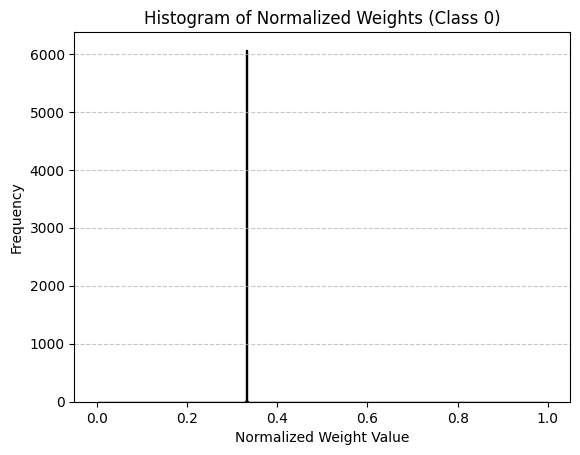

In [18]:
import matplotlib.pyplot as plt
import numpy as np

# Your normalization logic
row = weights_int8[8]
min_val, max_val = row.min(), row.max()
if max_val - min_val != 0:
    row_norm = (row - min_val) / (max_val - min_val)
else:
    row_norm = np.zeros_like(row)

# Plot histogram
plt.hist(row_norm, bins=500, edgecolor='black')
plt.xlabel("Normalized Weight Value")
plt.ylabel("Frequency")
plt.title("Histogram of Normalized Weights (Class 0)")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


In [132]:
from collections import Counter
import numpy as np

# Normalization logic
row = weights_int8[0]
min_val, max_val = row.min(), row.max()
if max_val - min_val != 0:
    row_norm = (row - min_val) / (max_val - min_val)
else:
    row_norm = np.zeros_like(row)

# Count frequencies
freqs = Counter(row_norm)

# Mask values that appear more than 5 times
row_masked = np.array([0 if freqs[val] > 5 else val for val in row_norm])

print(row_masked)


[4.10223305e-01 3.37605596e-01 6.83974922e-01 1.05394192e-01 4.46721524e-01 8.19359124e-01 3.56396317e-01 8.47300291e-01 3.53851438e-01 4.51344579e-01 2.15927437e-01 4.99987572e-01 7.17986703e-01 2.39391431e-01 6.39850676e-01 5.57350814e-01 2.64541537e-01 5.22605300e-01 1.73993766e-01 2.19644263e-01 6.53628767e-01 1.16280735e-01 8.45255375e-01 7.34958351e-01 2.81560123e-01 4.56140429e-01 7.36231863e-01 5.95084548e-01 5.59688568e-01 8.36954117e-01 3.57351989e-01 4.31743145e-01 5.84633529e-01 1.69766396e-01 3.70725393e-01 4.86052066e-01 7.27147937e-01 4.21752214e-01 1.55899361e-01 1.80052578e-01 4.40562934e-01 6.26189947e-01 1.73591882e-01 1.75229833e-01 2.95780718e-01 6.53243005e-01 2.37807602e-01 1.17973045e-01 8.25101674e-01 8.13739777e-01 5.34871995e-01 2.65904546e-01 1.01481430e-01 3.83612692e-01 6.98055446e-01 8.48937154e-01 4.85753477e-01 7.63956904e-01 1.62390918e-01 7.89032698e-01 6.98929727e-01 5.16725421e-01 5.53420544e-01 1.18903391e-01 6.13409914e-02 6.94279194e-01 9.6114948

## Sparsity

In [9]:
model = nn.Linear(768*8, 100)
model.load_state_dict(torch.load("./models/mlp_vit_l1_inet100_6ep.pth"))

<All keys matched successfully>

In [10]:
import torch
import numpy as np

# pick your multiplier
k = 0.5  

# grab weights
W = model.weight.data  # nn.Linear layer
absW = W.abs()

# compute threshold
threshold = k * absW.std()

# zero out small weights
sparse_W = W.clone()
sparse_W[absW < threshold] = 0.0

# load back
#model.linear.weight.data = sparse_W

(array([[  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,  95.,   0.,   1.,   0.,   2.,   1.,   0.,   1.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.],
        [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0., 100.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.],
        [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0., 100.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.],
        [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0., 100.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.],
        [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0., 100.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.],
        [  0.,   0.,   0.,   0.,   0.,   0.,   0.,

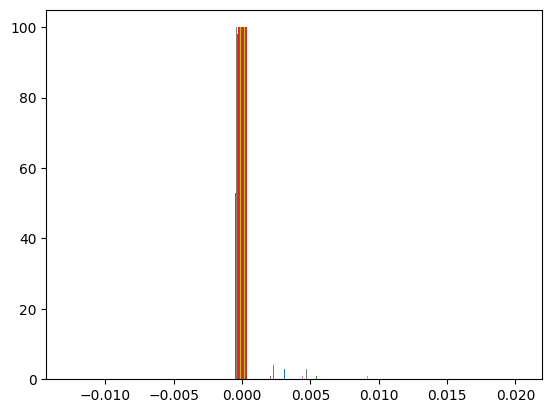

In [ ]:
plt.hist(sparse_W, bins=30)
plt.show()

In [39]:
import numpy as np

# Disable NumPy truncation for full print
np.set_printoptions(threshold=np.inf, linewidth=np.inf)

for i in range(100):
    print(sparse_W[i].detach().cpu().numpy())

[ 0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.          0.

In [ ]:
num_zero = (sparse_W == 0).sum().item()
num_total = sparse_W.numel()
sparsity = 100.0 * num_zero / num_total
print(f"Sparsity: {sparsity:.2f}%")


Sparsity: 98.80%


In [11]:
model.weight.data = sparse_W
print(model.weight)

Parameter containing:
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]], requires_grad=True)


In [14]:
test_loader, _ = Load_ImageNet100(transform=None, train=False, batch_size=256, dataset=True)
train_loader, _ = Load_ImageNet100(transform=None, train=True, batch_size=256, dataset=True)

loss_fn = nn.CrossEntropyLoss()

test_mlp(
    image_loader=test_loader,
    mlp=model,
    loss_fn=loss_fn,
    vit_full=vit_full,
    sae=sae,
    internal_map=image_dataset.class_to_idx
)

Testing: 100%|██████████| 20/20 [00:19<00:00,  1.01batch/s, loss=0.4399]

Test finished. Avg loss: 0.4000, Accuracy: 94.91%


(0.40004169940948486, 94.91131756756756)

In [17]:
model = nn.Linear(768*8, 100)
model.load_state_dict(torch.load("./models/mlp_vit_l1_inet100_6ep.pth"))


test_mlp(
    image_loader=test_loader,
    mlp=model,
    loss_fn=loss_fn,
    vit_full=vit_full,
    sae=sae,
    internal_map=image_dataset.class_to_idx
)

Testing: 100%|██████████| 20/20 [00:20<00:00,  1.01s/batch, loss=0.4363]

Test finished. Avg loss: 0.3984, Accuracy: 95.00%


(0.3983613792806864, 94.99577702702703)

## Score Calculation